In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import folium
import geopandas as gpd

In [8]:
filepath=r'Dataset .csv'
dataset=pd.read_csv(filepath)
dataset.shape

(9551, 21)

In [9]:
dataset.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


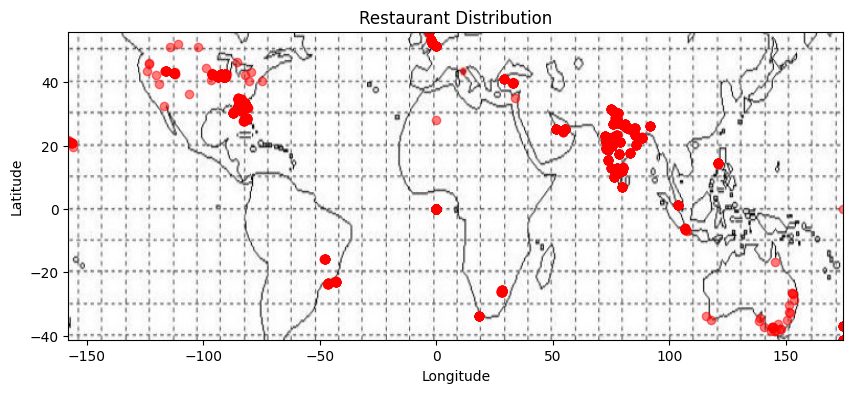

In [10]:
if "Latitude" and "Longitude" in dataset.columns:
  bg_image = mpimg.imread('worldmap1.jpg')
  fig, ax = plt.subplots(figsize=(10, 4))
  ax.imshow(bg_image, extent=[dataset["Longitude"].min(), dataset["Longitude"].max(), dataset["Latitude"].min(), dataset["Latitude"].max()], aspect='auto')
  ax.scatter(dataset["Longitude"], dataset["Latitude"], alpha=0.5, c='red')
  ax.set_xlabel("Longitude")
  ax.set_ylabel("Latitude")
  ax.set_title("Restaurant Distribution")   
  plt.show()
else:
  print("Latitude and longitude columns not found.")

In [11]:
restaurants_location = gpd.GeoDataFrame(dataset, geometry=gpd.points_from_xy(dataset['Longitude'], dataset['Latitude']))
restaurants_location.set_crs(epsg=4326, inplace=True)

mean_lat = restaurants_location['geometry'].y.mean()
mean_lon = restaurants_location['geometry'].x.mean()

map_restaurants = folium.Map(location=[mean_lat, mean_lon], zoom_start=15)
for _, row in restaurants_location.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['Restaurant Name'] 
    ).add_to(map_restaurants)

In [12]:
map_restaurants

In [13]:
dataset1 = dataset.copy()

In [14]:
country_count = dict(dataset1['Country Code'].value_counts().sort_values(ascending=False))
print(country_count)

{1: 8652, 216: 434, 215: 80, 30: 60, 214: 60, 189: 60, 148: 40, 208: 34, 14: 24, 162: 22, 94: 21, 184: 20, 166: 20, 191: 20, 37: 4}


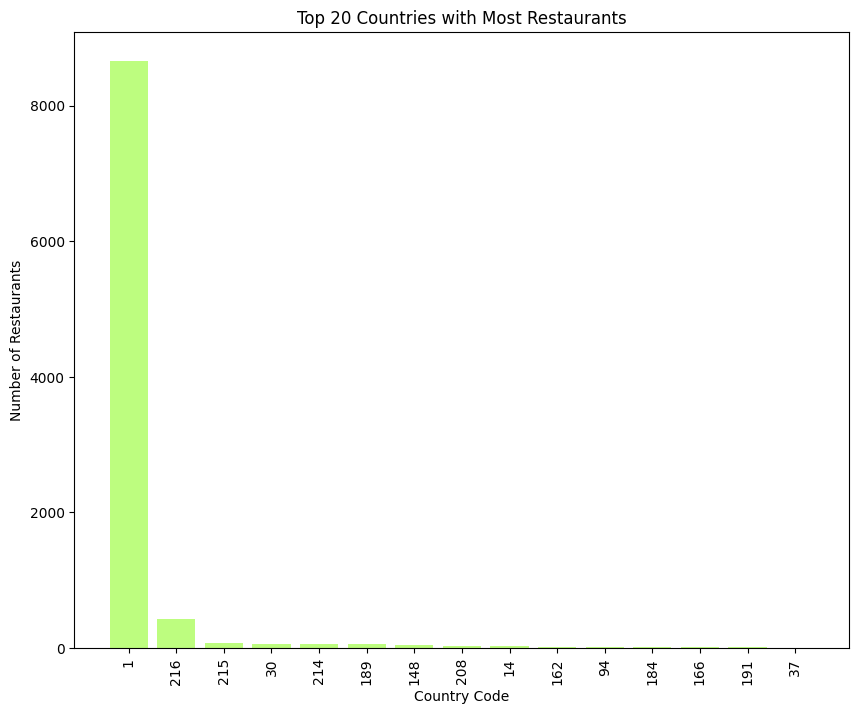

In [15]:
country = list(country_count.keys())
counts = list(country_count.values())
country_code = np.arange(len(country))

plt.figure(figsize=(10,8)) 
plt.bar(country_code, counts, color='lawngreen', align='center', alpha=0.5)
plt.xticks(country_code, country, rotation=90)
plt.xlabel("Country Code")
plt.ylabel("Number of Restaurants")
plt.title("Top 20 Countries with Most Restaurants")
plt.show()

In [16]:
locality_count = dict(dataset1['City'].value_counts().sort_values(ascending=False)[:30])
print(locality_count)

{'New Delhi': 5473, 'Gurgaon': 1118, 'Noida': 1080, 'Faridabad': 251, 'Ghaziabad': 25, 'Bhubaneshwar': 21, 'Amritsar': 21, 'Ahmedabad': 21, 'Guwahati': 21, 'Lucknow': 21, 'Cape Town': 20, 'Bras�_lia': 20, 'Rio de Janeiro': 20, 'S��o Paulo': 20, 'Albany': 20, 'Athens': 20, 'Augusta': 20, 'Manchester': 20, 'Boise': 20, 'Cedar Rapids/Iowa City': 20, 'Pune': 20, 'Colombo': 20, 'London': 20, 'Edinburgh': 20, 'Macon': 20, 'Pretoria': 20, 'Varanasi': 20, 'Ankara': 20, 'Columbus': 20, 'Doha': 20}


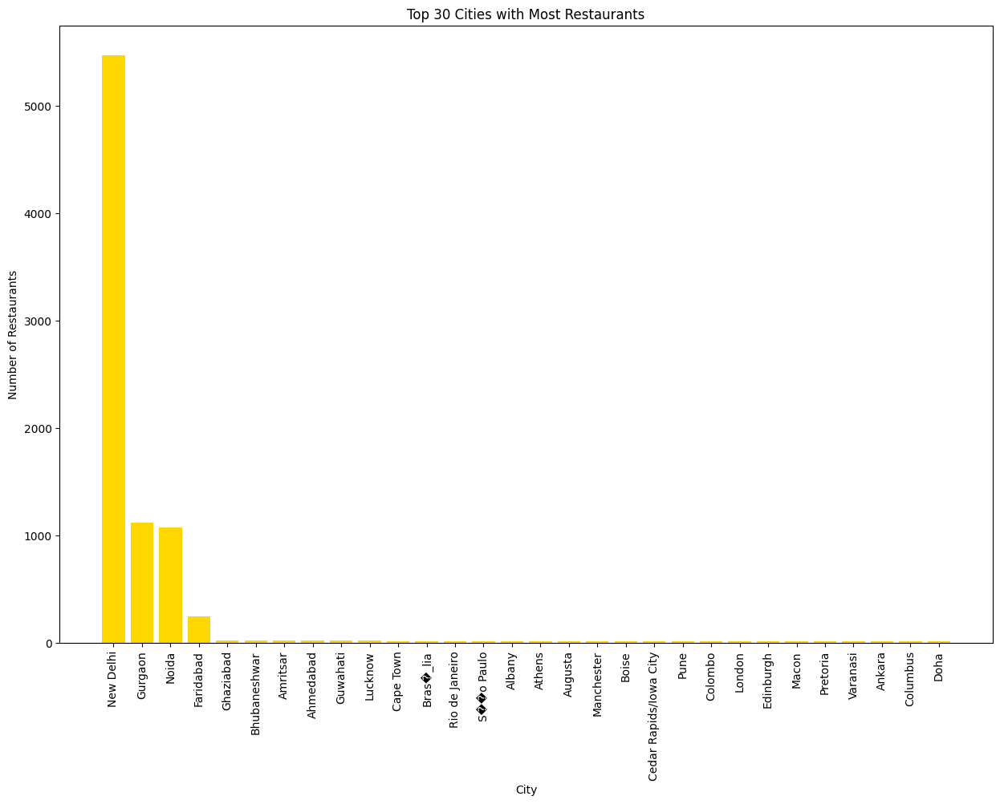

In [17]:
city = list(locality_count.keys())
count = list(locality_count.values())
city_name = np.arange(len(city))

plt.figure(figsize=(15,10))
plt.bar(city_name,count,color='gold',align='center',alpha=1)
plt.xticks(city_name, city, rotation=90)
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Top 30 Cities with Most Restaurants")
plt.show()

In [18]:
locality_count1 = dict(dataset1['City'].value_counts().sort_values(ascending=False))
print(locality_count1)

{'New Delhi': 5473, 'Gurgaon': 1118, 'Noida': 1080, 'Faridabad': 251, 'Ghaziabad': 25, 'Bhubaneshwar': 21, 'Amritsar': 21, 'Ahmedabad': 21, 'Guwahati': 21, 'Lucknow': 21, 'Cape Town': 20, 'Bras�_lia': 20, 'Rio de Janeiro': 20, 'S��o Paulo': 20, 'Albany': 20, 'Athens': 20, 'Augusta': 20, 'Manchester': 20, 'Boise': 20, 'Cedar Rapids/Iowa City': 20, 'Pune': 20, 'Colombo': 20, 'London': 20, 'Edinburgh': 20, 'Macon': 20, 'Pretoria': 20, 'Varanasi': 20, 'Ankara': 20, 'Columbus': 20, 'Doha': 20, 'Dalton': 20, 'Jaipur': 20, 'Des Moines': 20, 'Birmingham': 20, 'Dubuque': 20, 'Ranchi': 20, 'Auckland': 20, 'Surat': 20, 'Gainesville': 20, 'Davenport': 20, 'Vadodara': 20, 'Vizag': 20, 'Patna': 20, 'Wellington City': 20, 'Kanpur': 20, 'Savannah': 20, 'Ludhiana': 20, 'Rest of Hawaii': 20, 'Kochi': 20, 'Kolkata': 20, 'Pocatello': 20, 'Pensacola': 20, 'Mumbai': 20, 'Mangalore': 20, 'Singapore': 20, 'Mysore': 20, 'Nagpur': 20, 'Nashik': 20, 'Coimbatore': 20, 'Dehradun': 20, 'Orlando': 20, 'Tampa Bay': 2

In [19]:
average_ratings_by_city = {}
for city, count in locality_count.items():
  city_df = dataset1[dataset1['City'] == city]
  average_rating = city_df['Aggregate rating'].mean()
  average_ratings_by_city[city] = average_rating

sorted_average_ratings = {k: v for k, v in sorted(average_ratings_by_city.items(), key=lambda item: item[1], reverse=True)}
print(" Best Average Ratings per City Top 30 :")
for city, average_rating in sorted_average_ratings.items():
  print(f"{city}: {average_rating:.1f}")

 Best Average Ratings per City Top 30 :
London: 4.5
Ankara: 4.3
Rio de Janeiro: 4.3
Boise: 4.3
Pune: 4.2
Athens: 4.2
Lucknow: 4.2
Guwahati: 4.2
Pretoria: 4.2
Cedar Rapids/Iowa City: 4.2
Ahmedabad: 4.2
Augusta: 4.1
Macon: 4.1
Cape Town: 4.1
Edinburgh: 4.1
Doha: 4.1
Manchester: 4.0
Columbus: 4.0
Bhubaneshwar: 4.0
Colombo: 3.9
Amritsar: 3.7
Albany: 3.6
S��o Paulo: 3.5
Varanasi: 3.5
Bras�_lia: 3.5
Ghaziabad: 2.9
Gurgaon: 2.7
New Delhi: 2.4
Noida: 2.0
Faridabad: 1.9


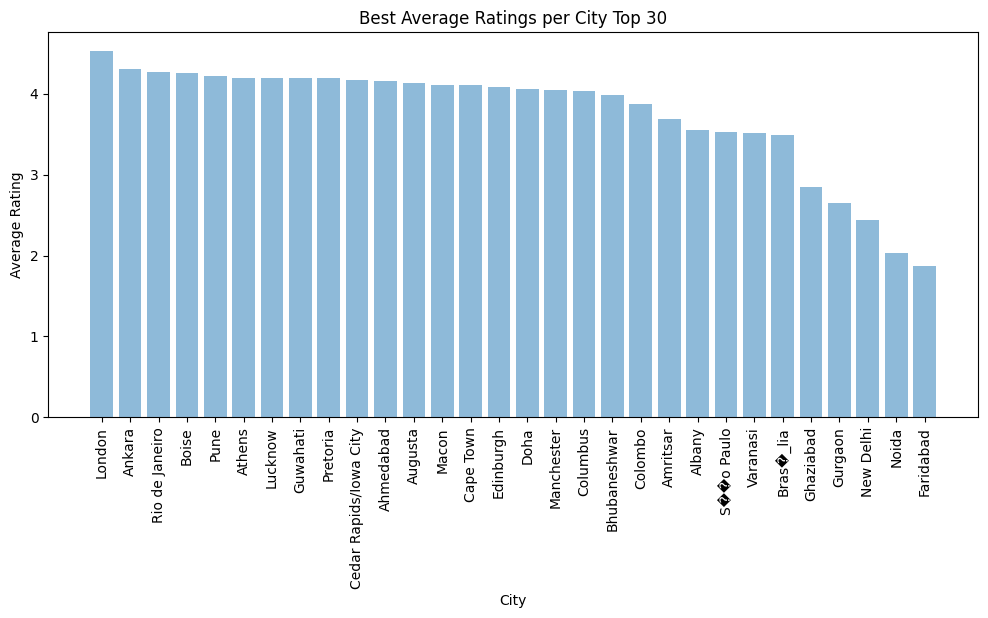

In [20]:
city = list(sorted_average_ratings.keys())
average_ratings = list(sorted_average_ratings.values())
city_name = np.arange(len(city))

plt.figure(figsize=(12, 5))
plt.bar(city_name, average_ratings, align='center', alpha=0.5)
plt.xticks(city_name, city, rotation=90)
plt.xlabel("City")
plt.ylabel("Average Rating")
plt.title("Best Average Ratings per City Top 30")
plt.show()

{'North Indian': 2992, ' Chinese': 1880, ' Fast Food': 1314, ' North Indian': 968, 'Chinese': 855, ' Mughlai': 780, 'Fast Food': 672, 'Bakery': 621, 'Cafe': 617, ' Italian': 530, ' Desserts': 503, ' Continental': 501, ' South Indian': 374, ' Street Food': 326, 'American': 278, 'South Indian': 262, 'Mithai': 246, 'Street Food': 236, 'Continental': 235, 'Italian': 234, 'Pizza': 232, 'Mughlai': 215, ' Thai': 205, 'Ice Cream': 178, ' Asian': 156, ' Beverages': 150, 'Desserts': 150, ' Pizza': 149, ' Burger': 135, ' Mithai': 134}


C:\Users\Moksh Mori\AppData\Local\Temp\ipykernel_15076\688353752.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cuisines_counts, y=cuisines_names, palette='viridis')


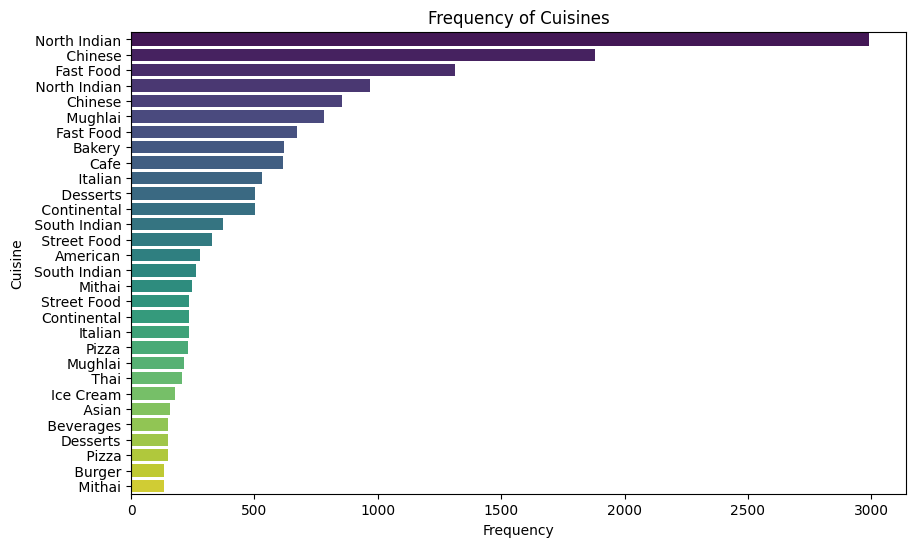

In [21]:
cuisines = dataset['Cuisines'].str.split(',').explode().value_counts().nlargest(30).to_dict()
print(cuisines)
cuisines_names = list(cuisines.keys())
cuisines_counts = list(cuisines.values())
plt.figure(figsize=(10, 6))
sns.barplot(x=cuisines_counts, y=cuisines_names, palette='viridis')
plt.xlabel('Frequency')
plt.ylabel('Cuisine')
plt.title('Frequency of Cuisines')
plt.show()


In [22]:
average_price_by_city = {}
for city, count in locality_count.items():
  city_df = dataset[dataset['City'] == city]
  average_price = city_df['Price range'].mean()
  average_price_by_city[city] = average_price

sorted_average_price = {k: v for k, v in sorted(average_price_by_city.items(), key=lambda item: item[1], reverse=True)}
print("Average Price by City:")
for city, average_price in sorted_average_price.items():
  print(f"{city}: {average_price:.1f}")

Average Price by City:
Pretoria: 3.7
Doha: 3.6
S��o Paulo: 3.6
Rio de Janeiro: 3.5
Cape Town: 3.2
Bras�_lia: 3.1
London: 3.0
Pune: 3.0
Edinburgh: 2.9
Colombo: 2.9
Ankara: 2.8
Manchester: 2.7
Ahmedabad: 2.6
Lucknow: 2.6
Guwahati: 2.5
Varanasi: 2.5
Augusta: 2.1
Columbus: 2.1
Boise: 2.0
Cedar Rapids/Iowa City: 2.0
Macon: 2.0
Bhubaneshwar: 1.9
Gurgaon: 1.9
Amritsar: 1.8
Ghaziabad: 1.8
Albany: 1.7
New Delhi: 1.6
Noida: 1.6
Athens: 1.6
Faridabad: 1.5


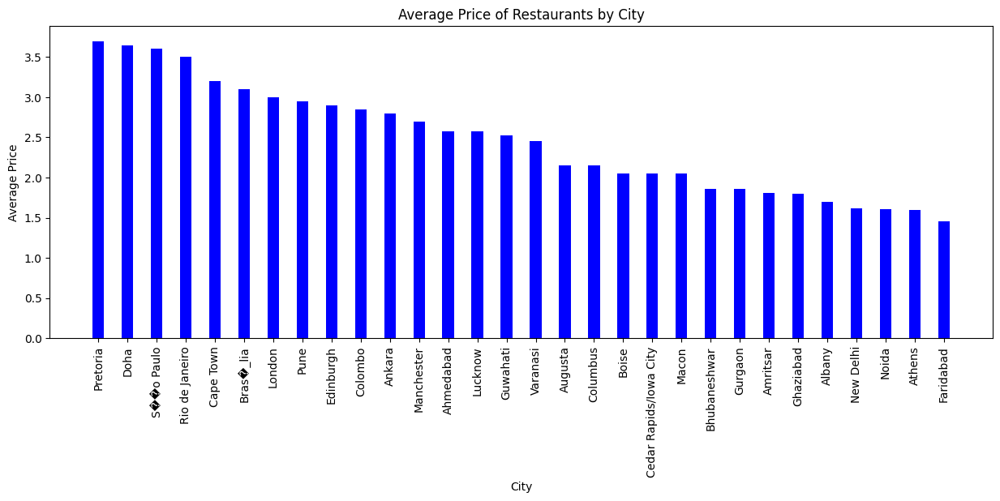

In [23]:
cities = list(sorted_average_price.keys())
average_price = list(sorted_average_price.values())

plt.figure(figsize=(15, 5))
plt.bar(cities, average_price, color='blue', width=0.4)

plt.xlabel("City")
plt.ylabel("Average Price")
plt.title("Average Price of Restaurants by City")

plt.xticks(rotation=90)
plt.show()

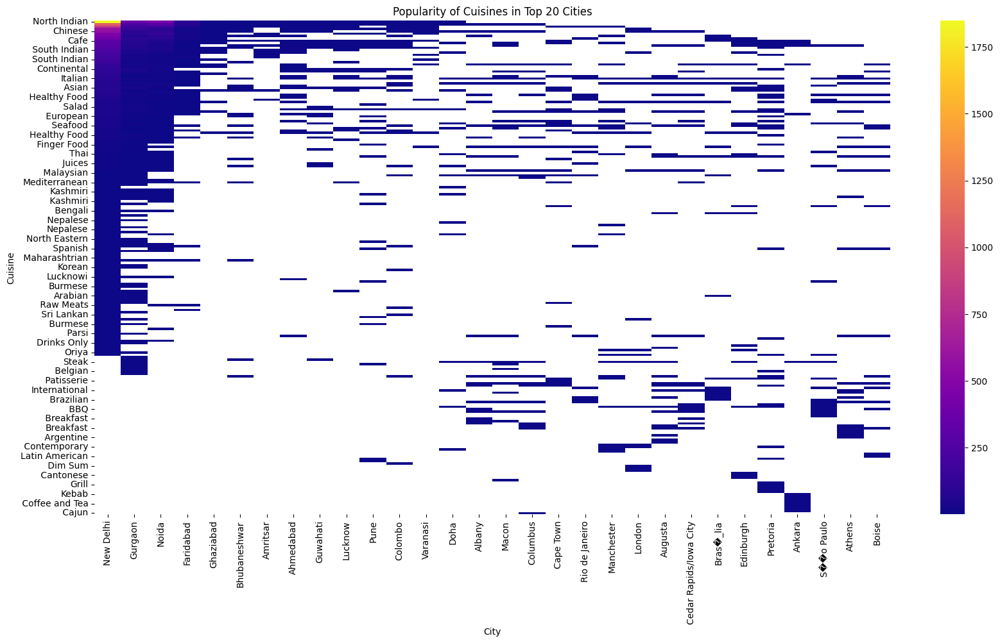

In [24]:
cuisine_popularity = {}

for city in locality_count:
  city_df = dataset[dataset['City'] == city]

  city_cuisines = city_df['Cuisines'].str.split(',').explode().value_counts().to_dict()

  for cuisine, count in city_cuisines.items():
    if cuisine not in cuisine_popularity:
      cuisine_popularity[cuisine] = {}
    cuisine_popularity[cuisine][city] = count

cuisine_popularity_df = pd.DataFrame(cuisine_popularity).transpose()

plt.figure(figsize=(20, 10))
sns.heatmap(cuisine_popularity_df, cmap='plasma')
plt.xlabel("City")
plt.ylabel("Cuisine")
plt.title("Popularity of Cuisines in Top 20 Cities")
plt.show()